## imports / setup

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd

from pathlib import Path
import torch
from torch import optim, nn
import PIL 
import pydicom
from functools import partial

In [3]:
import mask_functions

# helpers

In [9]:
def ls(p, re='*'):
    return [i for i in p.glob(re)]

In [10]:
def getImg(fpath):
    ds = pydicom.read_file( fpath) # read dicom image
    return ds.pixel_array, ds # get image array
    
def getMask(imgId, df, shape):
    """returns nd array mask"""
    df = df.loc[df['ImageId'] == imgId]
    rle = df['EncodedPixels'].tolist()[0].strip()

    mask = np.zeros([*shape])
    if not rle == '-1':
        mask = mask_functions.rle2mask(rle, *shape)
        mask = np.flip(mask, axis=0)
        mask = np.rot90(mask, -1)
    return mask

def getImageAndMask(fname, labels):
    imgf = fname 
    imgPath = str(imgf)
    imgId = imgf.stem
    img,_ = getImg( imgPath )
    mask = getMask(imgId, df=labels, shape=img.shape)
    return img, mask

In [11]:
def plot_multi(fn, size=[1,1], item_list=[]):
    fig, ax = plt.subplots(size[0],size[1], figsize=(40,60))
    for i, row_ax in enumerate(ax):
        for j, a in enumerate(row_ax):
            idx = size[1]*i+j
            if not idx > (len(item_list)-1):
                item = item_list[idx]
                fn(a, item)
                 
def plot_xray_mask(a, item, df, show_mask=True):
    img, mask = getImageAndMask(item, labels=df)
    a.imshow(img, cmap=plt.cm.bone)
    # if mask
    if not np.all(mask == 0): 
        a.set_title('Pneumothorax Present')
        a.imshow(mask, alpha=0.3, cmap='Reds')

# Check out sample

In [12]:
!ls

Readme.md    data		 pneumothorax.ipynb  sample%20images.zip
__MACOSX     download_images.py  requirements.in     sample_submission.csv
__pycache__  mask_functions.py	 requirements.txt


In [13]:
# get sample data
pwd = !pwd
path = Path(pwd[0])

In [14]:
dataPath = path/'data'
labels = dataPath/'train-rle-sample.csv'

In [15]:
fnames = ls(dataPath, '*.dcm'); fnames

[PosixPath('/home/ubuntu/code/siim-acr/data/1.2.276.0.7230010.3.1.4.8323329.10002.1517875220.939397.dcm'),
 PosixPath('/home/ubuntu/code/siim-acr/data/1.2.276.0.7230010.3.1.4.8323329.1000.1517875165.878027.dcm'),
 PosixPath('/home/ubuntu/code/siim-acr/data/1.2.276.0.7230010.3.1.4.8323329.10001.1517875220.930580.dcm'),
 PosixPath('/home/ubuntu/code/siim-acr/data/1.2.276.0.7230010.3.1.4.8323329.4982.1517875185.837576.dcm'),
 PosixPath('/home/ubuntu/code/siim-acr/data/1.2.276.0.7230010.3.1.4.8323329.4904.1517875185.355709.dcm'),
 PosixPath('/home/ubuntu/code/siim-acr/data/1.2.276.0.7230010.3.1.4.8323329.12743.1517875241.599591.dcm'),
 PosixPath('/home/ubuntu/code/siim-acr/data/1.2.276.0.7230010.3.1.4.8323329.1314.1517875167.222290.dcm'),
 PosixPath('/home/ubuntu/code/siim-acr/data/1.2.276.0.7230010.3.1.4.8323329.10003.1517875220.942420.dcm'),
 PosixPath('/home/ubuntu/code/siim-acr/data/1.2.276.0.7230010.3.1.4.8323329.10000.1517875220.938530.dcm'),
 PosixPath('/home/ubuntu/code/siim-acr/da

In [16]:
labelsdf = pd.read_csv(labels, names=['ImageId', 'EncodedPixels']); labelsdf.head()

,ImageId,EncodedPixels
0,1.2.276.0.7230010.3.1.4.8323329.1000.151787516...,-1
1,1.2.276.0.7230010.3.1.4.8323329.10000.15178752...,-1
2,1.2.276.0.7230010.3.1.4.8323329.10001.15178752...,-1
3,1.2.276.0.7230010.3.1.4.8323329.10002.15178752...,-1
4,1.2.276.0.7230010.3.1.4.8323329.10003.15178752...,-1


In [17]:
mask = getMask(fnames[1].stem, labelsdf, [1024, 1024])

np.all(mask == 0)

True

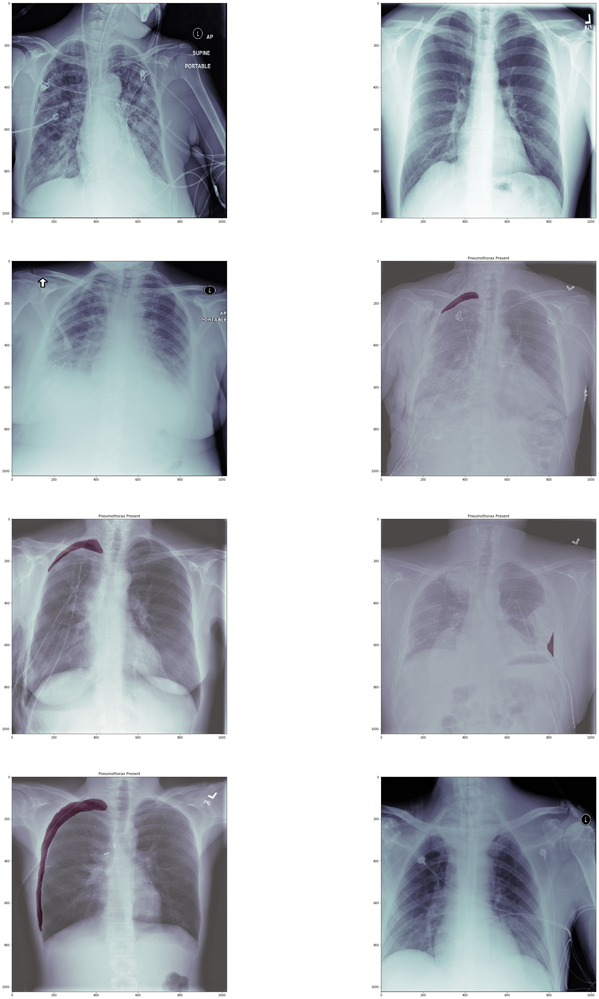

In [18]:
plot_samples = partial(plot_xray_mask, df=labelsdf, show_mask=True)
plot_multi(plot_samples, [4,2], item_list=fnames)

# Full data set

In [20]:
dataPath = Path('/home/ubuntu/data')
path = dataPath/'siim-acr'

In [21]:
ls(path)

[PosixPath('/home/ubuntu/data/siim-acr/dicom-images-test'),
 PosixPath('/home/ubuntu/data/siim-acr/train-rle.csv'),
 PosixPath('/home/ubuntu/data/siim-acr/siim-acr-pneumothorax-segmentation-data.zip'),
 PosixPath('/home/ubuntu/data/siim-acr/dicom-images-train')]

In [22]:
testpath = path/'dicom-images-test'
trainpath = path/'dicom-images-train'
trainlabels = path/'train-rle.csv'

## Mask Labels

In [23]:
df_rle_labels = pd.read_csv(trainlabels); 
df_rle_labels.columns = ['ImageId', 'EncodedPixels']
df_rle_labels.head()

,ImageId,EncodedPixels
0,1.2.276.0.7230010.3.1.4.8323329.5597.151787518...,-1
1,1.2.276.0.7230010.3.1.4.8323329.12515.15178752...,-1
2,1.2.276.0.7230010.3.1.4.8323329.4904.151787518...,175349 7 1013 12 1009 17 1005 19 1003 20 1002...
3,1.2.276.0.7230010.3.1.4.8323329.32579.15178751...,407576 2 1021 7 1015 10 1013 12 1011 14 1008 ...
4,1.2.276.0.7230010.3.1.4.8323329.32579.15178751...,252069 1 1021 3 1020 4 1018 5 1018 6 1016 7 1...


## Image files

In [24]:
ls(trainpath)[0]

PosixPath('/home/ubuntu/data/siim-acr/dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.11610.1517875233.906871')

In [25]:
ls(ls(ls(trainpath)[0])[0])[0]

PosixPath('/home/ubuntu/data/siim-acr/dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.11610.1517875233.906871/1.2.276.0.7230010.3.1.3.8323329.11610.1517875233.906870/1.2.276.0.7230010.3.1.4.8323329.11610.1517875233.906872.dcm')

In [26]:
img_list = []

for i in ls(trainpath):
    for fld in ls(i):
        for img in ls(fld):
            img_list.append(img)

In [32]:
trn_fnames = img_list

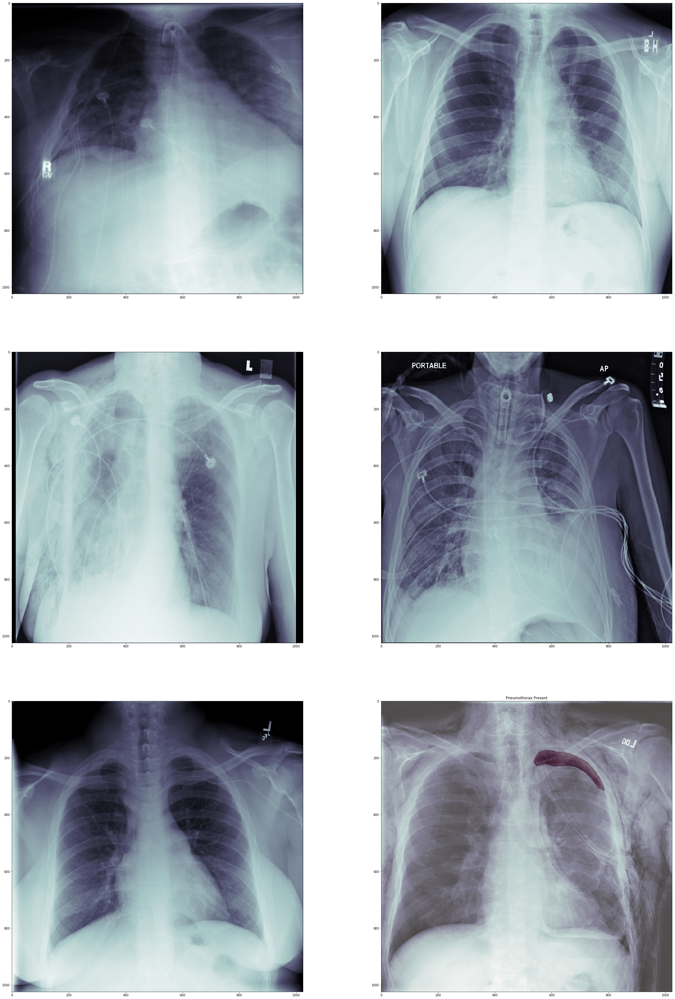

In [219]:
plot_trn = partial(plot_xray_mask, df=df_rle_labels, show_mask=True)
plot_multi(plot_trn, [3,2], item_list=trn_fnames[35:])